# Error Analysis
In this notebook we will look at the trends in our model. We will find where the model is badly preforming and be able to use this information to correct or model, features, or raw data. This notebook will be similer to the feature engineering notebook but will have the added feature of model preformance.

First we will import our cleaned raw data, our model, and our feature pipline.

In [114]:
import numpy as np
import pandas as pd
import cloudpickle as cp

df = pd.read_parquet("solar_cleaned.parquet")
md = cp.load(open("trained_model.sav", 'rb'))
feature_pipeline = cp.load(open('feature_pipeline.sav', 'rb'))

Here we are taking a sample of our data to work with and assigning a unique id to each row. This will be used to match weather data to error data. 

In [4]:
plot_data = df.copy()
plot_data['id'] = plot_data.index

In [118]:
def make_params(temperature, dew_point, relative_humidity, daily_precipitation,
       station_pressure, wind_speed, hourly_visibility=10, cloud_cover=0,
       mostly_cloudy=0, mostly_clear=0, clear=0, cloudy=0, partly_cloudy=0,
       overcast=0, rain_light=0, tstorm=0, drizzle=0, rain_heavy=0, rain=0,
       fog=0, snow_light=0, snow=0, snow_heavy=0, freezing_rain=0,
       freezing_drizzle=0, ice_pellets=0, ice_pellets_light=0,
       ice_pellets_heavy=0, flurries=0, freezing_rain_heavy=0,
       freezing_rain_light=0, fog_light=0):
    return {
        'temperature': temperature,
        'dew_point': dew_point,
        'relative_humidity': relative_humidity,
        'daily_precipitation': daily_precipitation,
        'station_pressure': station_pressure,
        'wind_speed': wind_speed,
        'hourly_visibility': hourly_visibility,
        'cloud_cover': cloud_cover,
        'mostly_cloudy': mostly_cloudy,
        'mostly_clear': mostly_clear,
        'clear': clear,
        'cloudy': cloudy,
        'partly_cloudy': partly_cloudy,
        'overcast': overcast,
        'rain_light': rain_light,
        'tstorm': tstorm,
        'drizzle': drizzle,
        'rain_heavy': rain_heavy,
        'rain': rain,
        'fog': fog,
        'snow_light': snow_light,
        'snow': snow,
        'snow_heavy': snow_heavy,
        'freezing_rain': freezing_rain,
        'freezing_drizzle': freezing_drizzle,
        'ice_pellets': ice_pellets,
        'ice_pellets_light': ice_pellets_light,
        'ice_pellets_heavy': ice_pellets_heavy,
        'flurries': flurries,
        'freezing_rain_heavy': freezing_rain_heavy,
        'freezing_rain_light': freezing_rain_light,
        'fog_light': fog_light
    }

params = make_params(temperature=70, dew_point=78, relative_humidity=89, daily_precipitation=0,
       station_pressure=90, wind_speed=3)

md.predict(params)

TypeError: can not initialize DMatrix from dict

Next we run the sample through our model and output the predictions. We create a DataFrame that holds the error and the absolute value error. We then merge this dataset with the weather data based on the id we set.

In [5]:
pred = np.array([])
for row in md.predict(feature_pipeline.fit_transform(plot_data)):
    pred = np.append(pred, row)
    
real = np.array([])
for row in plot_data['dni_efficiency'].values.tolist():
    real = np.append(real, row)

pdata = pd.DataFrame({
    'abs_error': abs(pred - real),
    'error': (pred - real),
    'predicted': pred,
    'id': plot_data['id'],
    'real': real
})

# merge data
merged_data = plot_data[plot_data['id'].isin(pdata['id'].unique())]
merged_data = merged_data.merge(pdata)

## Distribution Analysis
Here we are looking at the distribution of the models preformance. This will give us a brief and general overview of issues we need to look out for. For example we plot a basic boxplot and finds that our model is predicting mostly under an error of 0.35 and with 50% of the predictions being under 0.15.

From this we can take away that the model is preforming in an acceptable range but still predicts odd values at times. We will have to explore what is making these outliers preform so poorly.

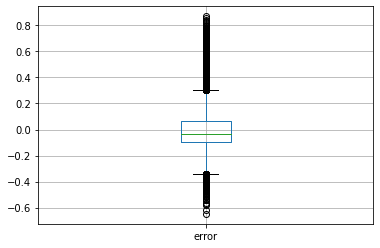

In [5]:
merged_data.boxplot('error')

To look at the distribution in more detail we plot a histogram of the regular (+-) error data. This graph tells us that the model is under-predicting just as much as it is over-predicting. The under-predicted results do not span as far negative compared to the over-predicted results. This means that there the models worst predictions are over-predictions. We will need to explore this detail further in the next graph.

In [16]:
import altair as alt

hist = alt.Chart(merged_data[:5000]).mark_bar(color="#F5606D").encode(
    alt.X("error:Q", bin=alt.Bin(maxbins=100)),
    y='count()'
).interactive()

rule = alt.Chart(merged_data[:5000]).mark_rule(color='black').encode(
    x='median(error):Q',
    size=alt.value(3)
)

hist + rule

alt.LayerChart(...)

## Outlier Exploration
Here we will start to look more closely at values that are in the outlier range. This will identify which features stand out when predicting bad values.

To show this we make a plot that shows the error vs the efficiency. We will mark the outliers in green and the rest in blue.

In [19]:
s = merged_data.sample(3000)


point = alt.Chart(s).mark_point(size=3, opacity=.5).encode(
    alt.Y('error:Q'),
    x='dni_efficiency:Q',
    color=alt.condition("datum.abs_error>0.3", alt.ColorValue('#BE0000'), alt.ColorValue('#4D4D4D'))
)

rule = alt.Chart(s).transform_loess( 'dni_efficiency', 'error').mark_line(color='red', size=3).encode(
    alt.Y('error:Q'),
    x='dni_efficiency:Q'
)

point + rule

alt.LayerChart(...)

We find that when the model attempts to predict lower efficiencies, it will return a result with less accuracy (more error). We also find a trend were error generally decreases as the model attempts to predict higher efficiencies.

When we look at the outliers, we see that the majority of them are over-predictions. At the moment this does not tell us anything about which features are bad, but it does tell us that we should be looking at data points with lower efficiencies. A valid next step would be to look at days where there we see no clouds but a poor efficiency.

Next we will take a sample of only the outliers and plot the features that stand out. We do this by first normalizing the data and then taking the median of each feature in the outlier group and the more accurate group. Then take the absolute differnce of the two medians. Higher values will translate to larger differences in the data.

/Users/gagekrumbach/.local/share/virtualenvs/Solar_Forcaster-m3btlaz4/lib/python3.7/site-packages/pandas/core/frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
/Users/gagekrumbach/.local/share/virtualenvs/Solar_Forcaster-m3btlaz4/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:993: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/Users/gagekrumbach/.local/share/virtualenvs/Solar_Forcaster-m3btlaz4/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


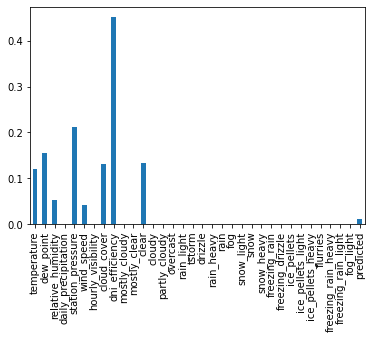

In [8]:
s = merged_data.sample(10000)
cols_to_norm = list(s.drop(columns=['abs_error']).columns)
norm = s[['abs_error']]
norm[cols_to_norm] = s[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

abs(norm[norm['abs_error']<.35].median() - norm[norm['abs_error']>.35].median()
   ).drop(labels=['STATION', 'DATE', 'id', 'real', 'latitude', 'longitude', 'abs_error', 'error','ghi_efficiency','dhi_efficiency']
         ).plot.bar()

We find that dni_efficiency is the highest as expexted, because we found in the previous graph that dni_efficiency corelated with error. We also find that there are a few other columns showing differences.

First we will look more closely at the `clear` feature by looking into the raw data around the `clear` feature. We find that even on days that are mostly clear, real efficiency is still low. So these data points are either missing some other information or are inheritably wrong. In any case, it is in our best interest to remove these data points if possible.

In [9]:
s[s['abs_error']>.35][['cloudy', 'mostly_cloudy', 'partly_cloudy', 'mostly_clear',
                                           'clear', 'real', 'predicted', 'error']].head()

,cloudy,mostly_cloudy,partly_cloudy,mostly_clear,clear,real,predicted,error
14041,0.0,0.0,0.0,0.0,11.0,0.150646,0.841135,0.690489
25276,2.0,0.0,3.0,1.0,7.0,0.239298,0.610219,0.370920
5647,0.0,0.0,0.0,0.0,9.0,0.449761,0.867228,0.417467
31851,0.0,0.0,2.0,0.0,9.0,0.447890,0.861522,0.413631
22835,0.0,0.0,0.0,1.0,11.0,0.412542,0.794571,0.382029


Before we go ahead and remove these datapoints, lets first check where this error is coming from. Knowing why there is error can help us later on in developement. Here we find that error is greater in the colder months of the year.

In [22]:
sample = merged_data.sample(n=5000)

sample['month'] = pd.DatetimeIndex(sample['DATE']).month

bar_e = alt.Chart(sample, title='Error').mark_bar(size=15, color='red').encode(
    alt.X("month:O"),
    alt.Y('median(abs_error):Q', scale=alt.Scale(zero=False)))

bar_t = alt.Chart(sample, title='Temperature').mark_bar(size=15,color='red').encode(
    alt.X("month:O"),
    alt.Y('median(temperature):Q', scale=alt.Scale(zero=False)))

bar_h = alt.Chart(sample,title='Dew Point').mark_bar(size=15,color='red').encode(
    alt.X("month:O"),
    alt.Y('median(dew_point):Q', scale=alt.Scale(zero=False)))

(bar_e | bar_t | bar_h)

alt.HConcatChart(...)

Finally we can remove the bad data points.

In [11]:
to_remove = merged_data[merged_data['abs_error'] > .35]
to_remove = to_remove[to_remove['clear'] >= 8]['id']
removed = plot_data[~plot_data['id'].isin(to_remove)].drop(columns=['id'])
removed.to_parquet('solar_removed.parquet', engine='fastparquet', compression='GZIP')